<a href="https://colab.research.google.com/github/KimaniKibuthu/tomato-disease-classification/blob/main/Tomato.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Tomato Disease Classification

## Introduction

Classify the diseases affecting the tomato plant

## Methodology

The methodology will include:
1. Data obtainance
2. Data preparation
3. Modelling

# Libraries & Variables

In [2]:
# Libraries

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split

import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import Model, Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten, MaxPool2D, Conv2D, GlobalAveragePooling2D
from tensorflow.keras.applications import EfficientNetB7, InceptionV3

In [3]:
# Variables
TARGET_SIZE = 256
TEST_SIZE = 0.5
BATCH_SIZE = 64
RANDOM_STATE = 42
EPOCHS = 10
LR = 0.001

# Data Obtainance

In [4]:
# Obtain data
def setup(kaggle_name, kaggle_key):
  # Setup the username and ID
  os.environ["KAGGLE_USERNAME"] = kaggle_name
  os.environ["KAGGLE_KEY"] = kaggle_key

  print('Done')


In [5]:
# Load data
setup('kimanikibuthu', 'f85c0bb5d43058fddcce7902e1325677')

!kaggle datasets download -d noulam/tomato


Done
 99% 735M/743M [00:07<00:00, 75.2MB/s]
100% 743M/743M [00:07<00:00, 108MB/s] 


In [6]:
# Unzip data
!unzip /content/tomato.zip

Streaming output truncated to the last 5000 lines.
  inflating: new plant diseases dataset(augmented)/New Plant Diseases Dataset(Augmented)/train/Tomato___healthy/ac022a2b-764c-4507-8dd9-4470b75763e4___RS_HL 9937.JPG  
  inflating: new plant diseases dataset(augmented)/New Plant Diseases Dataset(Augmented)/train/Tomato___healthy/ac249839-fe21-45cd-9e09-f0023fa7ee3a___GH_HL Leaf 273.JPG  
  inflating: new plant diseases dataset(augmented)/New Plant Diseases Dataset(Augmented)/train/Tomato___healthy/acdbf632-8d26-472d-874f-6d7df5cd0432___RS_HL 9897.JPG  
  inflating: new plant diseases dataset(augmented)/New Plant Diseases Dataset(Augmented)/train/Tomato___healthy/acdf2283-0e7c-4ccd-8817-1019e3a8ed20___RS_HL 9943.JPG  
  inflating: new plant diseases dataset(augmented)/New Plant Diseases Dataset(Augmented)/train/Tomato___healthy/acf28842-7821-4f31-ab73-2787e332e852___RS_HL 0011.JPG  
  inflating: new plant diseases dataset(augmented)/New Plant Diseases Dataset(Augmented)/train/Tomato___h

# Data Preparation

**Setup DataFrames**

Setup a dataframes

In [7]:
# Create a dataframe maker
def dataframe_creator(list_of_directories):
  files_final = np.array([])
  labels_final = np.array([])
  for directory in list_of_directories:
    files = np.array(os.listdir(directory))
    label = directory.split('/')[-1]
    labels = np.full_like(files, label)

    # update 
    files_final = np.append(files_final, files)
    labels_final = np.append(labels_final, labels)

  dataframe = pd.concat([pd.DataFrame(files_final, columns=['files']), 
                        pd.DataFrame(labels_final, columns=['labels'])],
                        axis=1)
  
  return dataframe



In [8]:
# Instantiate the list of directories
list_of_valid_directories = [
                       '/content/New Plant Diseases Dataset(Augmented)/valid/Tomato___Bacterial_spot',
                       '/content/New Plant Diseases Dataset(Augmented)/valid/Tomato___Early_blight',
                       '/content/New Plant Diseases Dataset(Augmented)/valid/Tomato___Late_blight',
                       '/content/New Plant Diseases Dataset(Augmented)/valid/Tomato___Leaf_Mold',
                       '/content/New Plant Diseases Dataset(Augmented)/valid/Tomato___Septoria_leaf_spot',
                       '/content/New Plant Diseases Dataset(Augmented)/valid/Tomato___Spider_mites Two-spotted_spider_mite',
                       '/content/New Plant Diseases Dataset(Augmented)/valid/Tomato___Target_Spot',
                       '/content/New Plant Diseases Dataset(Augmented)/valid/Tomato___Tomato_Yellow_Leaf_Curl_Virus',
                       '/content/New Plant Diseases Dataset(Augmented)/valid/Tomato___Tomato_mosaic_virus',
                       '/content/New Plant Diseases Dataset(Augmented)/valid/Tomato___healthy',

]


list_of_train_directories = [
                       '/content/New Plant Diseases Dataset(Augmented)/train/Tomato___Bacterial_spot',
                       '/content/New Plant Diseases Dataset(Augmented)/train/Tomato___Early_blight',
                       '/content/New Plant Diseases Dataset(Augmented)/train/Tomato___Late_blight',
                       '/content/New Plant Diseases Dataset(Augmented)/train/Tomato___Leaf_Mold',
                       '/content/New Plant Diseases Dataset(Augmented)/train/Tomato___Septoria_leaf_spot',
                       '/content/New Plant Diseases Dataset(Augmented)/train/Tomato___Spider_mites Two-spotted_spider_mite',
                       '/content/New Plant Diseases Dataset(Augmented)/train/Tomato___Target_Spot',
                       '/content/New Plant Diseases Dataset(Augmented)/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus',
                       '/content/New Plant Diseases Dataset(Augmented)/train/Tomato___Tomato_mosaic_virus',
                       '/content/New Plant Diseases Dataset(Augmented)/valid/Tomato___healthy',

]

In [9]:
# create dataframes
df_valid = dataframe_creator(list_of_valid_directories)
df_train = dataframe_creator(list_of_train_directories)

In [10]:
# View dataframes
df_valid.sample(5)

,files,labels
899,c882c715-ae30-410e-9585-bd7061cf44a4___RS_Erly...,Tomato___Early_blight
1067,bd9341f4-34d9-4acb-9aa0-5dbff08f8ba6___GHLB_PS...,Tomato___Late_blight
4502,76284899-9c5e-44bf-a160-02649418ec49___RS_HL 0...,Tomato___healthy
261,496716ca-78e6-4ae6-b3d4-2ed9f91f52b0___GCREC_B...,Tomato___Bacterial_spot
2804,887c5359-fb30-4e3a-86cd-d35bca0699eb___Com.G_T...,Tomato___Target_Spot


In [11]:
df_train.sample(5)

,files,labels
4062,e56bc72a-6c24-4746-bd53-741c470e1be2___RS_Late...,Tomato___Late_blight
4964,fee09bd4-a9e3-4174-bd89-4f9b6f911902___GHLB2 L...,Tomato___Late_blight
4008,0220afd9-d40e-4b72-8405-78b417c7b8af___GHLB2 L...,Tomato___Late_blight
3523,250f6c43-1800-4c21-9d73-cc51fe144bbc___RS_Erly...,Tomato___Early_blight
13722,ba0e3c46-555d-4d48-9853-3ae7f148e2fa___YLCV_NR...,Tomato___Tomato_Yellow_Leaf_Curl_Virus


**View Images**

In [12]:
def show_images(images, label):

    # Extract 16 random images from it
    random_images = [np.random.choice(images) for i in range(16)]

    # Adjust the size of your images
    plt.figure(figsize=(16,12))

    # Iterate and plot random images
    for i in range(16):
        plt.subplot(4,4, i + 1)
        img = plt.imread(os.path.join(f'/content/New Plant Diseases Dataset(Augmented)/train/{label}', random_images[i]))
        
        try:
          plt.imshow(img, cmap='gray')
          plt.axis('off')
        except FileNotFoundError:
          pass

    # Adjust subplot parameters to give specified padding
    plt.tight_layout()  

In [13]:
def image_printer(data):
  labels = data['labels'].unique()

  # For each label, print label and show images
  for label in labels:
    df = data.loc[data['labels'] == label]
    files = df['files'].values
    show_images(files, label)
    
    

FileNotFoundError: ignored

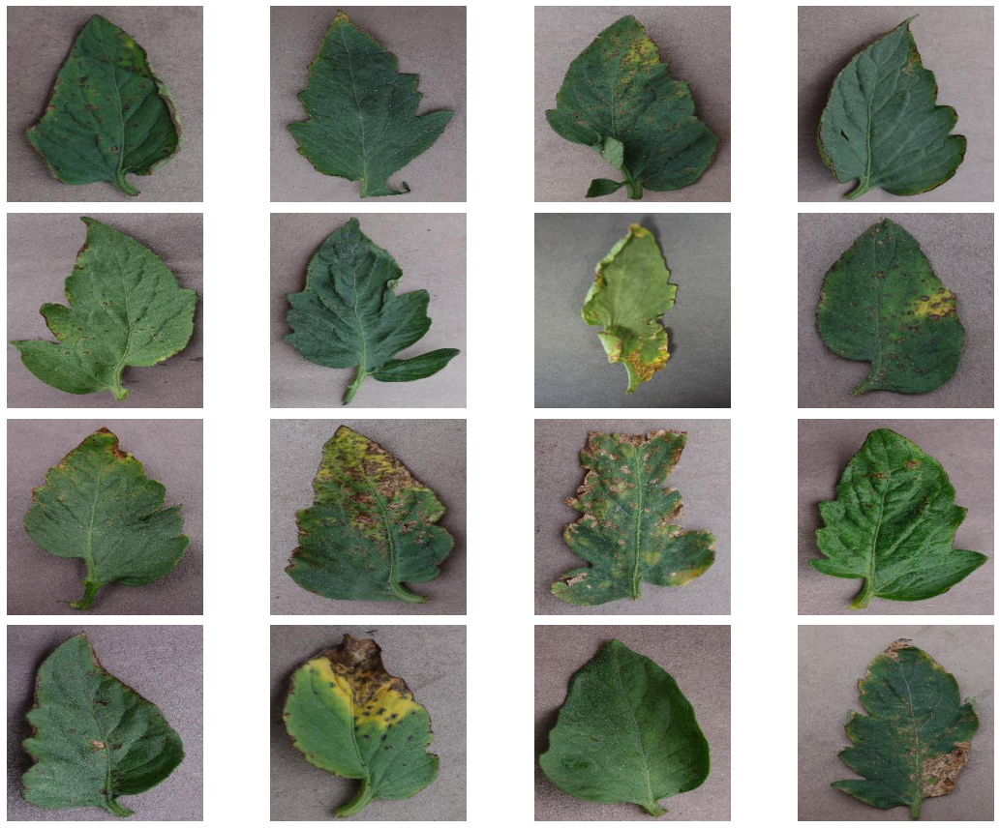

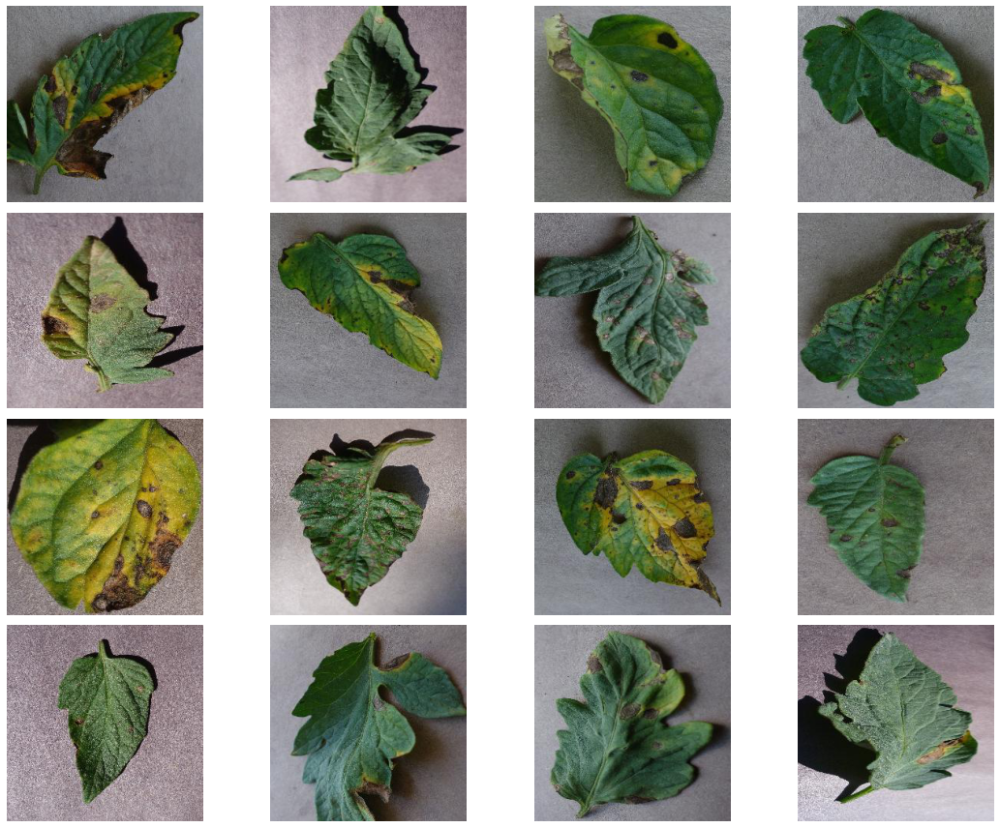

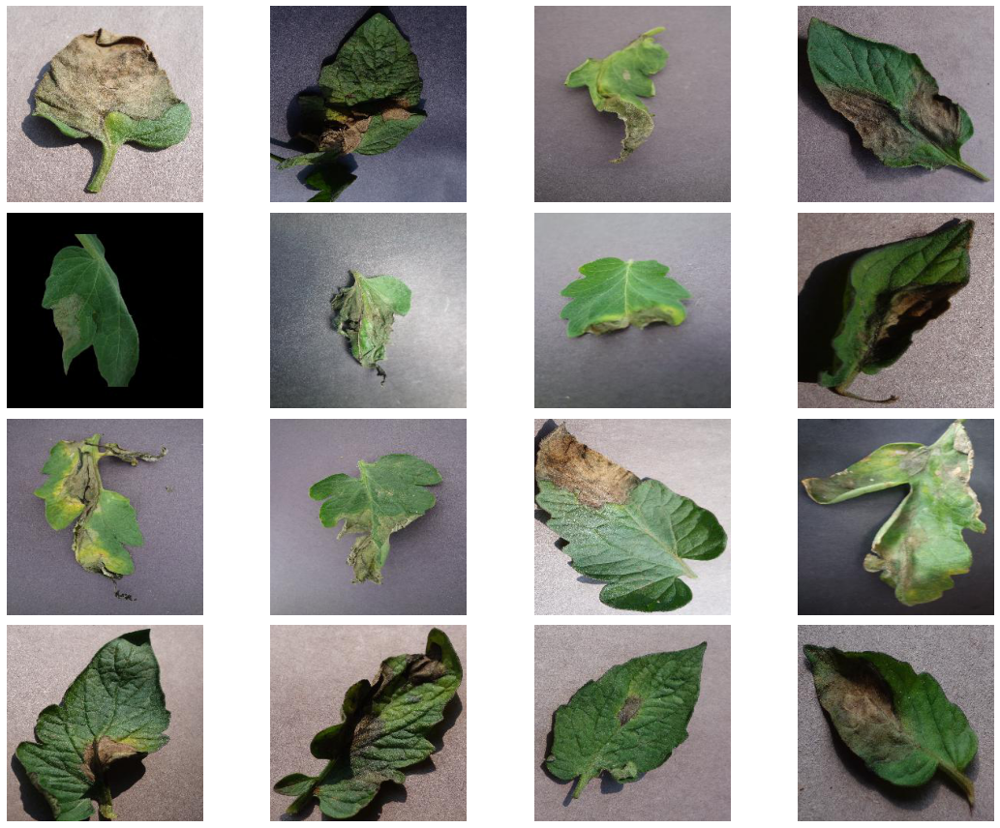

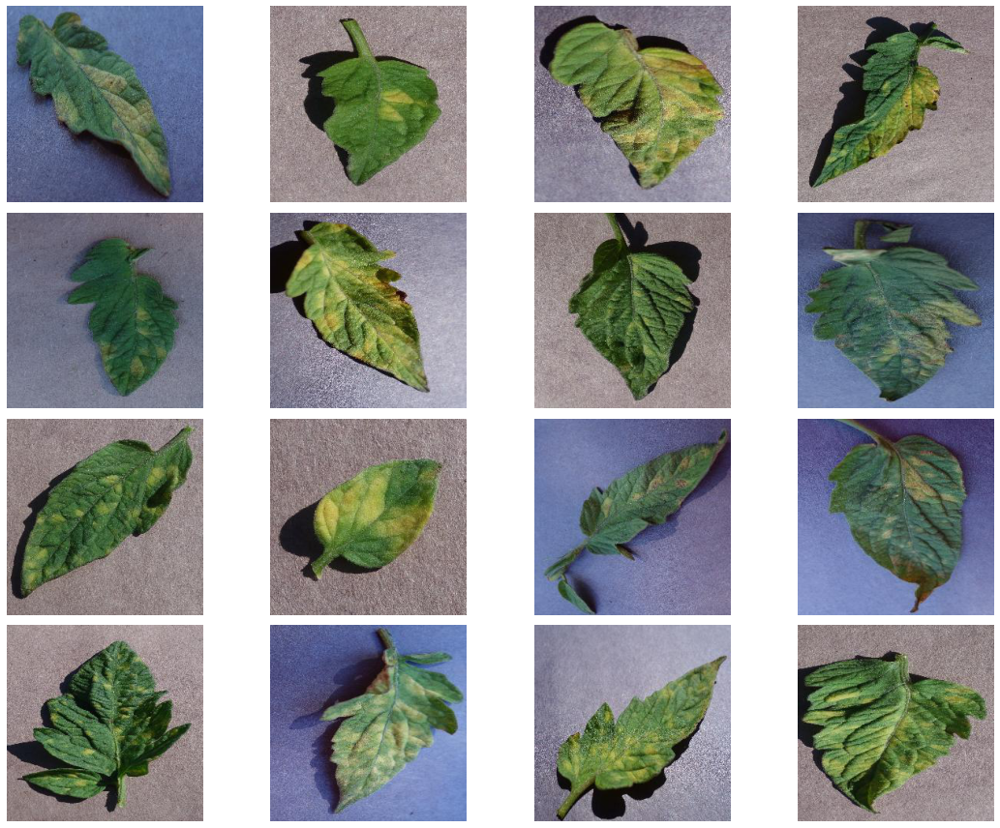

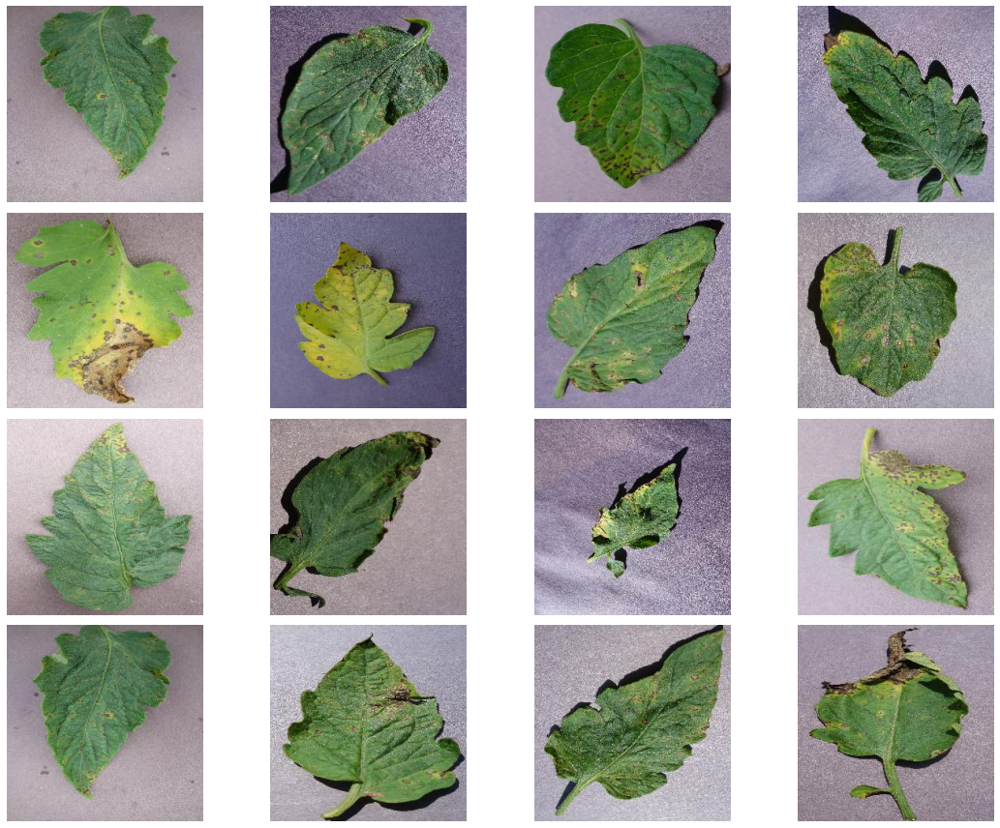

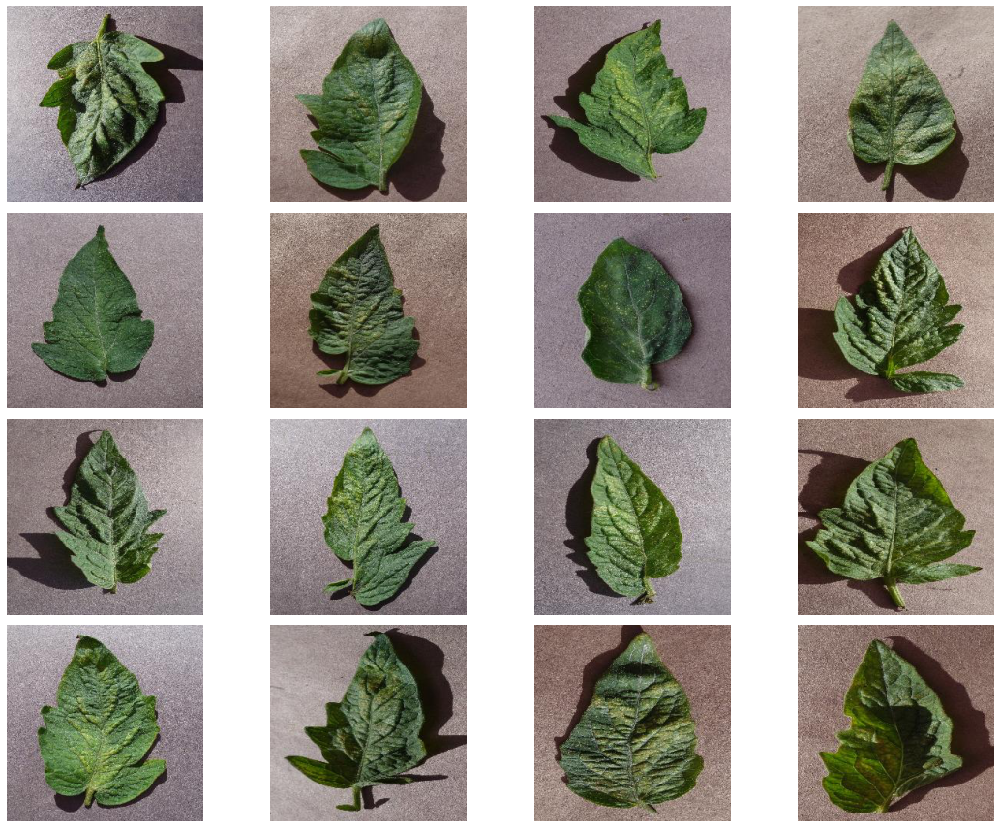

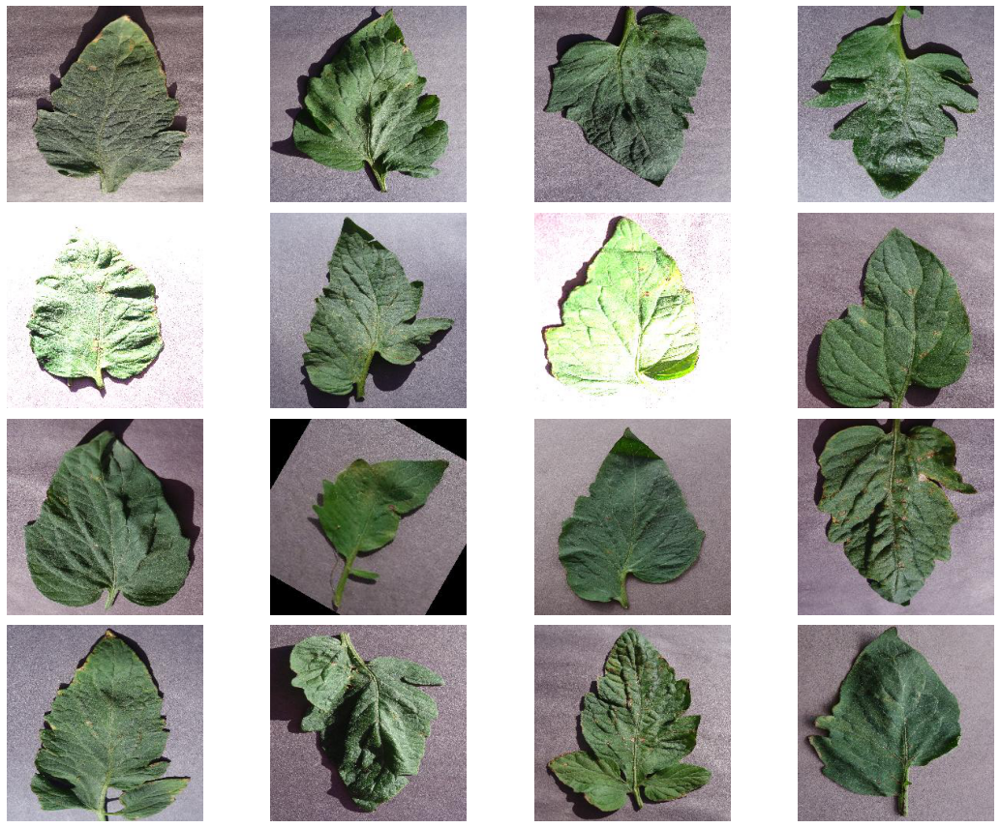

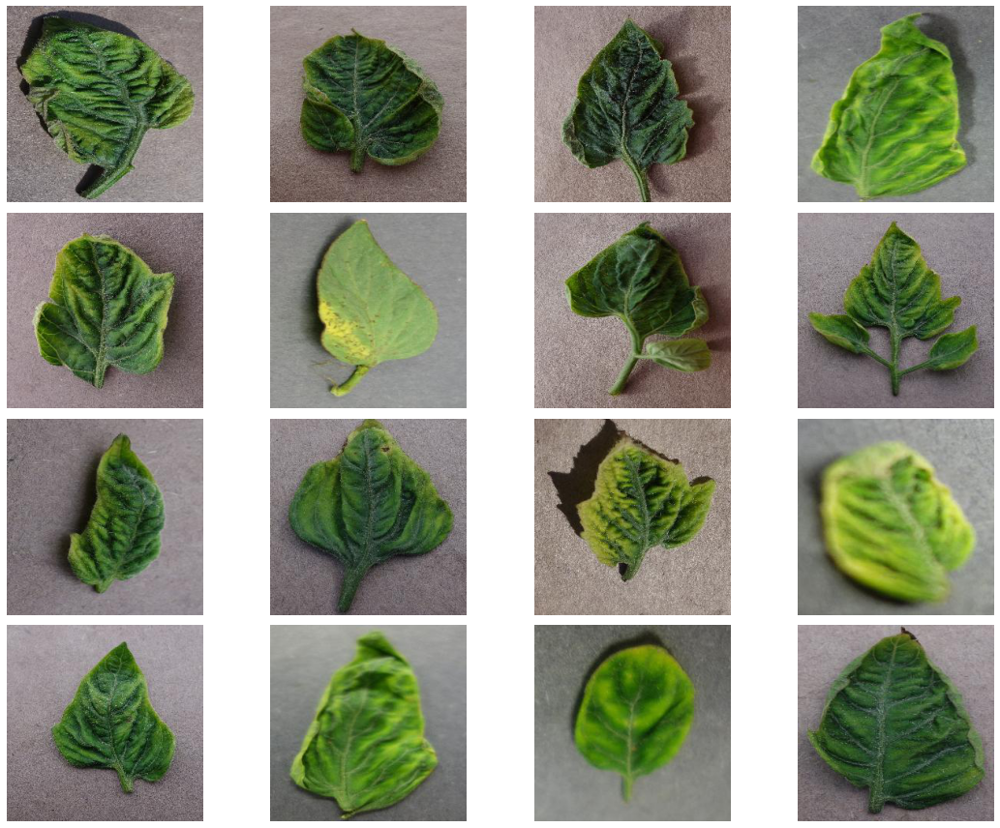

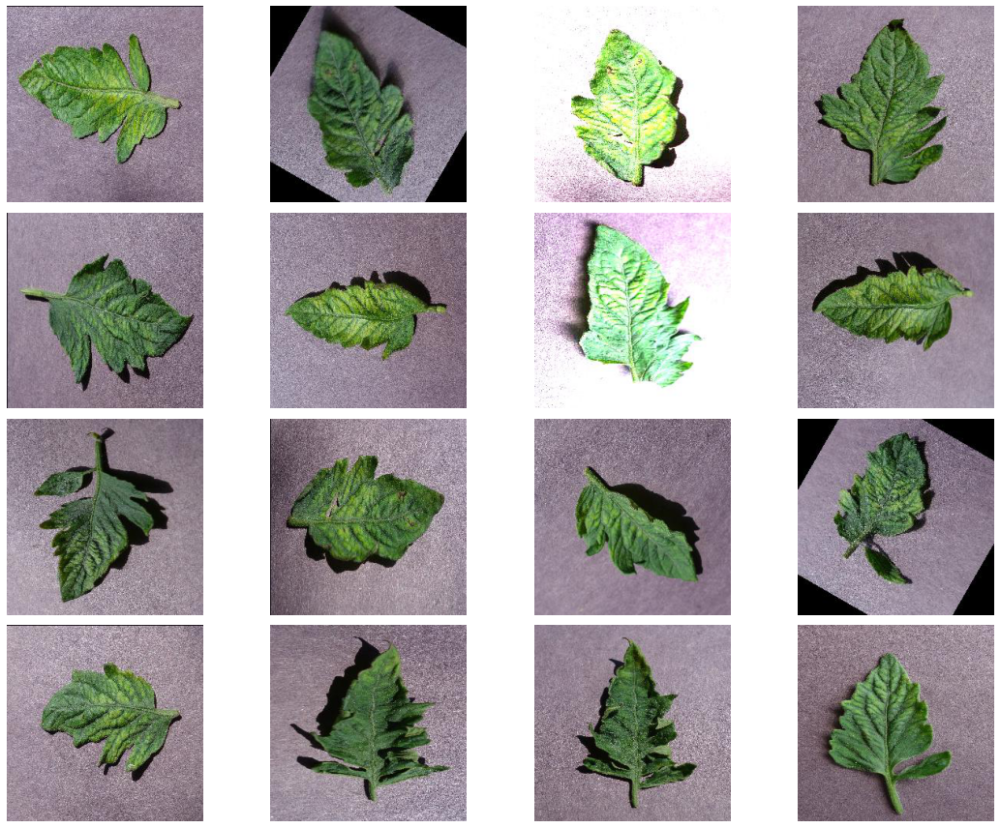

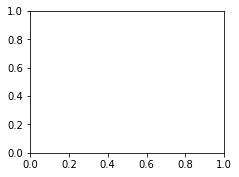

In [14]:
image_printer(df_train)

**Split the data**

In [16]:
# Split the data
def splitter(data, size):
    valid, test = train_test_split(data,
                               test_size = size,
                               random_state = RANDOM_STATE,
                               stratify = data['labels'])

    # Reset indices
    valid.reset_index(drop=True, inplace = True)
    test.reset_index(drop = True, inplace = True)

    return valid, test


In [17]:
# split the data
valid, test = splitter(df_valid, TEST_SIZE)

**Make directories for test and validation**


In [18]:
valid['labels'].unique()

array(['Tomato___Tomato_Yellow_Leaf_Curl_Virus', 'Tomato___Leaf_Mold',
       'Tomato___Target_Spot', 'Tomato___Early_blight',
       'Tomato___Tomato_mosaic_virus', 'Tomato___Septoria_leaf_spot',
       'Tomato___healthy', 'Tomato___Late_blight',
       'Tomato___Bacterial_spot',
       'Tomato___Spider_mites Two-spotted_spider_mite'], dtype=object)

In [19]:
def directory_maker(name, data):
  import shutil
  parent_dir = '/content/New Plant Diseases Dataset(Augmented)'
  path = os.path.join(parent_dir, name)
  if not os.path.exists(path):
    os.makedirs(path)
  labels = data['labels'].unique()

  for label in labels:
    label_path = os.path.join(path, label)
    if not os.path.exists(label_path):
      os.makedirs(label_path)

    df = data.loc[data['labels'] == label]
    files = df['files'].values
    for file in files:
      if not os.path.exists(os.path.join(label_path, file)):
        os.mkdir(os.path.join(label_path, file))

      shutil.copy(os.path.join(f'/content/New Plant Diseases Dataset(Augmented)/valid/{label}', 
                             file), os.path.join(label_path, file))

In [20]:
# Validation directories
directory_maker('validation', valid)

# Test directories
directory_maker('test', test)

**Visualize distribution**

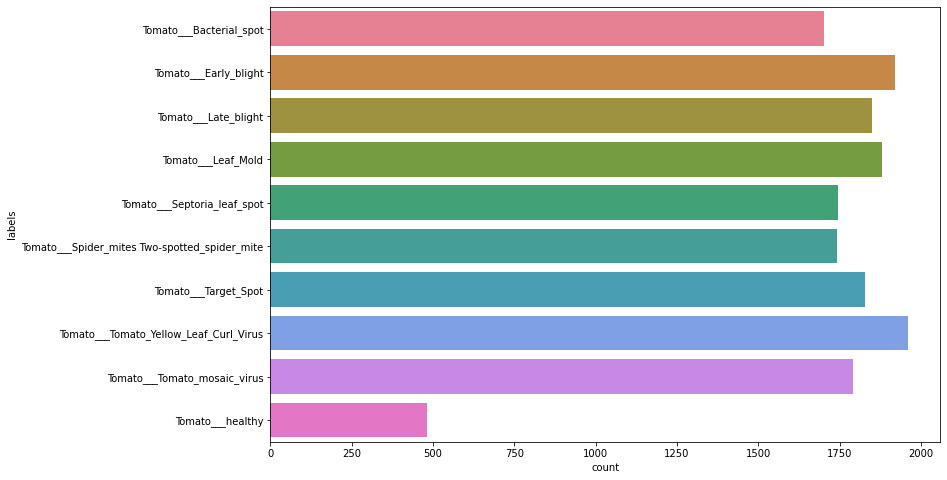

In [21]:
# Visualize the distribution of classes in train data
plt.figure(figsize=(12,8))
sns.countplot(y='labels', 
              data=df_train,
              palette='husl');

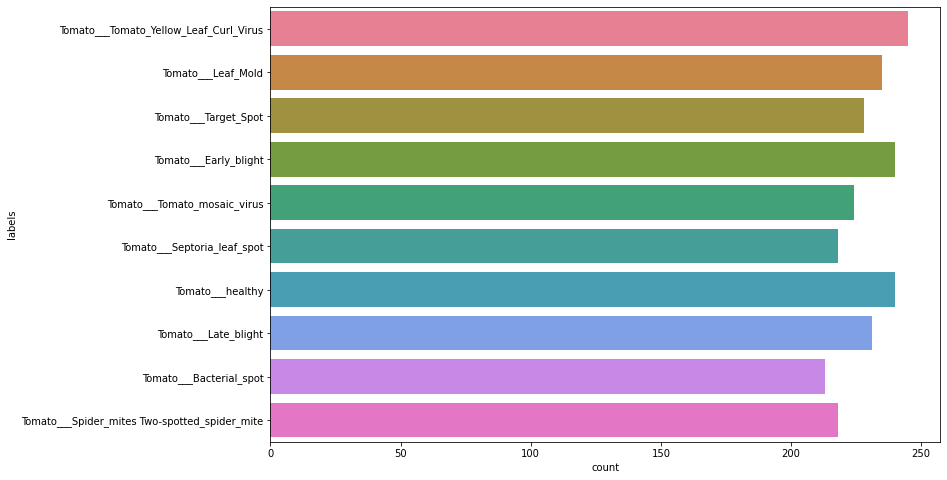

In [22]:
# Visualize validation
plt.figure(figsize=(12,8))
sns.countplot(y='labels', 
              data=valid,
              palette='husl');

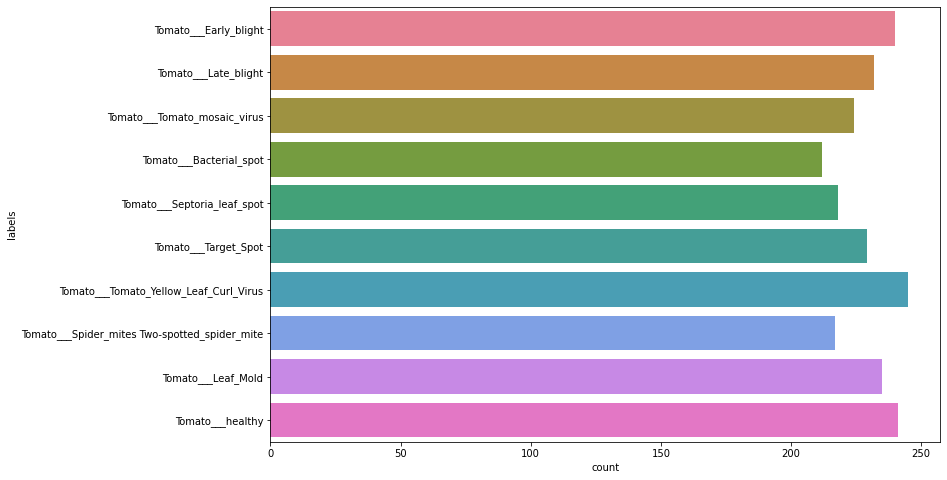

In [23]:
# Visualize test
plt.figure(figsize=(12,8))
sns.countplot(y='labels', 
              data=test,
              palette='husl');

Test and validation have the same distribution. We are good to go

**Instantiate Generators**

In [24]:
# Train generator

train_generator = ImageDataGenerator(
    horizontal_flip = True,
    vertical_flip = True,
    rotation_range = 30,
    rescale = 1./255
    #preprocessing_function = tf.keras.applications.inception_v3.preprocess_input
)

# Validation generator
valid_generator = ImageDataGenerator(
    rescale = 1./255
    # preprocessing_function = tf.keras.applications.inception_v3.preprocess_input
    )

# test generator
test_generator = ImageDataGenerator(
    rescale = 1./255
    #preprocessing_function = tf.keras.applications.inception_v3.preprocess_input
)

In [25]:
# Data generators

# Train
train_datagen = train_generator.flow_from_directory(
    '/content/New Plant Diseases Dataset(Augmented)/train',
    target_size = (TARGET_SIZE, TARGET_SIZE),
    class_mode = 'categorical', 
    batch_size = BATCH_SIZE 
)


# Validation
val_datagen = valid_generator.flow_from_directory(
    '/content/New Plant Diseases Dataset(Augmented)/validation',
    target_size = (TARGET_SIZE, TARGET_SIZE),
    class_mode = 'categorical', 
    batch_size = BATCH_SIZE 
)

# test
test_datagen = test_generator.flow_from_directory(
    '/content/New Plant Diseases Dataset(Augmented)/test',
    target_size = (TARGET_SIZE, TARGET_SIZE),
    class_mode = 'categorical', 
    batch_size = BATCH_SIZE 
)


Found 18345 images belonging to 10 classes.
Found 2292 images belonging to 10 classes.
Found 2293 images belonging to 10 classes.


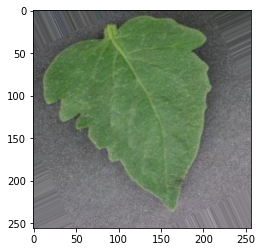

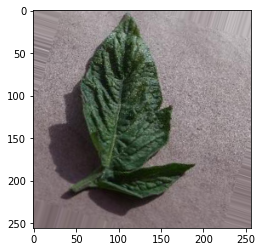

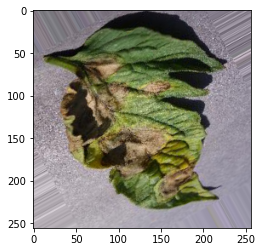

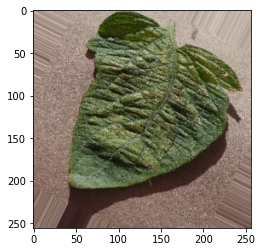

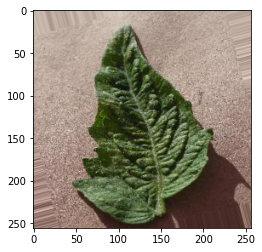

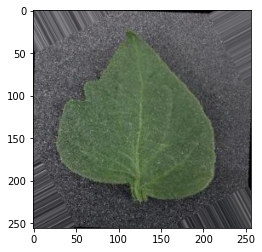

In [26]:
# Visualize an image
x_batch, y_batch = next(train_datagen)
for i in range (0,6):
    image = x_batch[i]
    plt.imshow(image)
    plt.show()

# Modelling

In [27]:
def create_model(num_classes):

  # Build model
  inception = InceptionV3(include_top=False, 
                          input_shape=(TARGET_SIZE, TARGET_SIZE, 3),
                          weights='imagenet')
  
  model = Sequential([
                      inception,
                      GlobalAveragePooling2D(),
                      Flatten(),
                      Dense(256, activation = 'relu', 
                          bias_regularizer=tf.keras.regularizers.L1L2(l1=0.01, 
                                                                      l2=0.001)),
                      Dropout(0.7),
                      Dense(32, activation = 'relu',
                          bias_regularizer=tf.keras.regularizers.L1L2(l1=0.01,
                                                                      l2=0.001)),
                      Dropout(0.7),
                      Dense(num_classes, activation = 'softmax')
  ])

  # Instantiate learning rate and optimizer
  loss = tf.keras.losses.CategoricalCrossentropy(from_logits = False,
                                                   label_smoothing=0.01,
                                                   name='categorical_crossentropy' )

  adam = tf.keras.optimizers.Adam(LR)

  # Compile model
  model.compile(loss = loss,
                optimizer = adam,
                metrics = ['categorical_accuracy'])
  
  return model





In [28]:
def model_fitter():
  # Instantiate model
  model = create_model(10)

  # instantiate callbacks
  
  early_stopper = tf.keras.callbacks.EarlyStopping(monitor='val_loss',
                                                 patience=5)

  # reduce learning rate
  reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor = 'val_loss',
                                  factor = 0.1,
                                  patience = 2,
                                  min_lr = 1e-6,
                                  mode = 'min',
                                  verbose = 1)

  callbacks = [early_stopper, reduce_lr]

  # Train model
  history = model.fit(train_datagen,
                    epochs=EPOCHS,
                    steps_per_epoch=int(np.ceil(len(df_train)/BATCH_SIZE)),
                    callbacks=callbacks,
                    validation_data=val_datagen,
                    validation_steps=int(np.ceil(len(valid)/BATCH_SIZE))
                    )
  
  return history

In [29]:
# fit model

history = model_fitter()

87916544/87910968 [==============================] - 1s 0us/step
Epoch 1/10
  1/265 [..............................] - ETA: 3:25:12 - loss: 3.1133 - categorical_accuracy: 0.1250

KeyboardInterrupt: ignored